<div style="border-radius:10px;
            border:#0b0265 solid;
           background-color:#e6e6ff;
           font-size:110%;
           letter-spacing:0.5px;
            text-align: center">

<center><h1 style="padding: 25px 0px; color:#0b0265; font-weight: bold; font-family: Cursive">
Brain MRI Segmentation 🧠</h1></center>    

</div>

<p align="center">
  <img width="550" height="300" src="https://www.researchgate.net/profile/Saritha-Saladi/publication/311934172/figure/fig2/AS:606518579838976@1521616706322/Gradient-based-genetic-algorithm-i-Original-MRI-imageii-Brain-tumor-segmentation.png">
</p>

## **Import Libraries and Data**

In [1]:
# visualisation
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.axes_grid import ImageGrid
import cv2
from skimage import io

# handle table-like data and matrices
import pandas as pd
import numpy as np
import os
from glob import glob
import random

# ignore warnings
import warnings
warnings.filterwarnings('ignore')

# model
from keras import backend as K
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras.layers import *
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.utils import plot_model
from tensorflow.keras import Model
from tensorflow.keras.models import load_model, save_model

# to display the total number of rows and columns present in the dataset
pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.
  after removing the cwd from sys.path.


In [2]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download mateuszbuda/lgg-mri-segmentation
! unzip /content/lgg-mri-segmentation.zip

Streaming output truncated to the last 5000 lines.
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7294_19890104/TCGA_DU_7294_19890104_9_mask.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_1.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_10.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_10_mask.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_11.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_11_mask.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_12.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_12_mask.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_13.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_1

In [3]:
train_files = []
mask_files = glob('lgg-mri-segmentation/kaggle_3m/*/*_mask*')

for i in mask_files:
    train_files.append(i.replace('_mask',''))

print(train_files[:10])
print(mask_files[:10])

['lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19950823/TCGA_DU_5853_19950823_9.tif', 'lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19950823/TCGA_DU_5853_19950823_18.tif', 'lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19950823/TCGA_DU_5853_19950823_11.tif', 'lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19950823/TCGA_DU_5853_19950823_10.tif', 'lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19950823/TCGA_DU_5853_19950823_26.tif', 'lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19950823/TCGA_DU_5853_19950823_36.tif', 'lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19950823/TCGA_DU_5853_19950823_29.tif', 'lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19950823/TCGA_DU_5853_19950823_28.tif', 'lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19950823/TCGA_DU_5853_19950823_12.tif', 'lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19950823/TCGA_DU_5853_19950823_5.tif']
['lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19950823/TCGA_DU_5853_19950823_9_mask.tif', 'lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19950823/TCGA_DU

In [4]:
pat = []
for i in range(len(train_files)):
  pat.append(train_files[i][31:][:train_files[i][31:].index('/')])

In [5]:
df = pd.DataFrame({'patient': pat,
                   'image_path': train_files,
                   'mask_path': mask_files})
df.head(2)

,patient,image_path,mask_path
0,TCGA_DU_5853_19950823,lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19...,lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19...
1,TCGA_DU_5853_19950823,lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19...,lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19...


In [6]:
# Add a column for diagnosis
def diagnosis(mask_path):
    value = np.max(cv2.imread(mask_path))
    if value > 0 : return 1
    else: return 0

In [7]:
df['diagnosis'] = df['mask_path'].apply(lambda x: diagnosis(x))
df.head(5)

,patient,image_path,mask_path,diagnosis
0,TCGA_DU_5853_19950823,lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19...,lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19...,0
1,TCGA_DU_5853_19950823,lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19...,lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19...,0
2,TCGA_DU_5853_19950823,lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19...,lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19...,0
3,TCGA_DU_5853_19950823,lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19...,lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19...,0
4,TCGA_DU_5853_19950823,lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19...,lgg-mri-segmentation/kaggle_3m/TCGA_DU_5853_19...,1


## **Visualization**

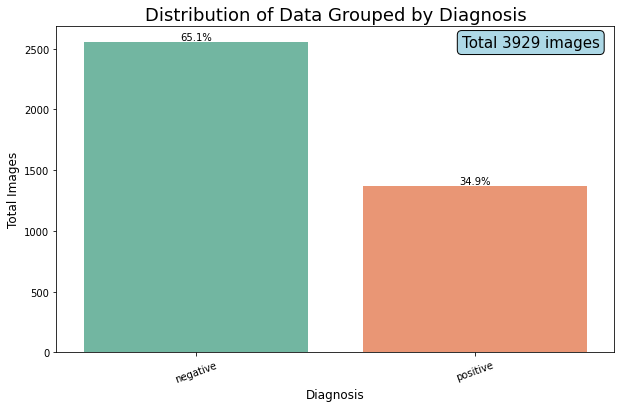

In [8]:
plt.figure(figsize=(10,6))
ax = sns.countplot(df['diagnosis'], palette = 'Set2')
plt.title('Distribution of Data Grouped by Diagnosis', loc = 'center', fontsize = 18)
plt.ylabel('Total Images', fontsize = 12)
plt.xlabel('Diagnosis', fontsize = 12)
plt.text(1.2, 2550, f'Total {df.shape[0]} images', size = 15, color = 'black', ha = 'center', va = 'center',
         bbox=dict(boxstyle = 'round', fc=('lightblue'), ec=('black')))
for p in ax.patches:
    x = p.get_bbox().get_points()[:,0]
    y = p.get_bbox().get_points()[1,1]
    ax.annotate('{:.1f}%'.format(100.*y/df.shape[0]), (x.mean(), y), ha = 'center', va = 'bottom')
x1 = [0,1]
xlab = ['negative','positive']
ax.set_xticks(x1)
ax.set_xticklabels(xlab, minor=False, rotation=20);

In [9]:
patients_by_diagnosis = df.groupby(['patient', 'diagnosis'])['diagnosis'].size().unstack().fillna(0)
patients_by_diagnosis.columns = ['Negative', 'Positive']
patients_by_diagnosis

,Negative,Positive
patient,,
TCGA_CS_4941_19960909,15,8
TCGA_CS_4942_19970222,14,6
TCGA_CS_4943_20000902,12,8
TCGA_CS_4944_20010208,11,9
TCGA_CS_5393_19990606,12,8
...,...,...
TCGA_HT_8563_19981209,14,9
TCGA_HT_A5RC_19990831,17,15
TCGA_HT_A616_19991226,17,11


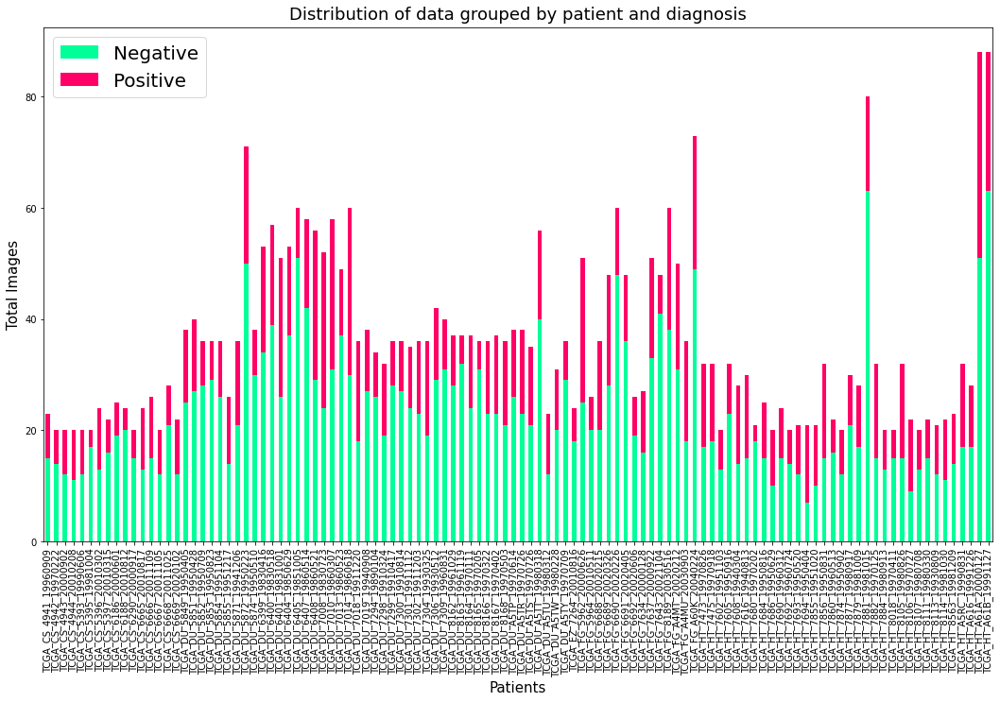

In [10]:
ax = patients_by_diagnosis.plot(kind='bar',stacked=True, figsize=(18, 10), color=['#00ff99', '#ff0066'])
ax.legend(fontsize=20);
ax.set_xlabel('Patients', fontsize = 15)
ax.set_ylabel('Total Images', fontsize = 15)
ax.set_title('Distribution of data grouped by patient and diagnosis', fontsize = 18, y=1.005);

Samples of images with a positive and negative diagnosis

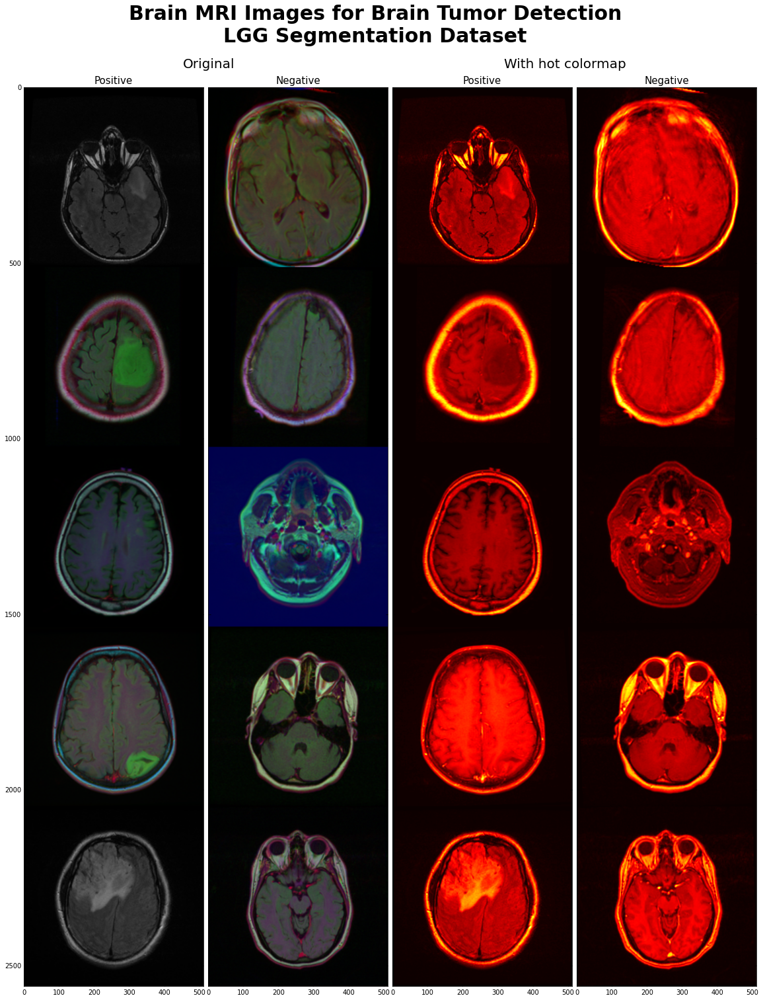

In [11]:
IMG_SIZE = 512

# Data
sample_yes_df = df[df['diagnosis'] == 1].sample(5).image_path.values
sample_no_df = df[df['diagnosis'] == 0].sample(5).image_path.values

sample_imgs = []
for i, (yes, no) in enumerate(zip(sample_yes_df, sample_no_df)):
    yes = cv2.resize(cv2.imread(yes), (IMG_SIZE, IMG_SIZE))
    no = cv2.resize(cv2.imread(no), (IMG_SIZE, IMG_SIZE))
    sample_imgs.extend([yes, no])

sample_yes_arr = np.vstack(np.array(sample_imgs[::2]))
sample_no_arr = np.vstack(np.array(sample_imgs[1::2]))

# Plot
fig = plt.figure(figsize=(25., 25.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(1, 4),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

grid[0].imshow(sample_yes_arr)
grid[0].set_title('Positive', fontsize=15)
grid[0].axis("off")
grid[1].imshow(sample_no_arr)
grid[1].set_title('Negative', fontsize=15)
grid[1].axis("off")

grid[2].imshow(sample_yes_arr[:,:,0], cmap='hot')
grid[2].set_title('Positive', fontsize=15)
grid[2].axis("off")
grid[3].imshow(sample_no_arr[:,:,0], cmap='hot')
grid[3].set_title('Negative', fontsize=15)
grid[3].axis("off")#set_title("No", fontsize=15)

# annotations
plt.figtext(0.36,0.90, 'Original' , va='center', ha='center', size=20)
plt.figtext(0.66,0.90, 'With hot colormap', va='center', ha='center', size=20)
plt.suptitle('Brain MRI Images for Brain Tumor Detection\nLGG Segmentation Dataset', y=.95, fontsize=30, weight='bold');

Samples of images and masks with a positive diagnosis

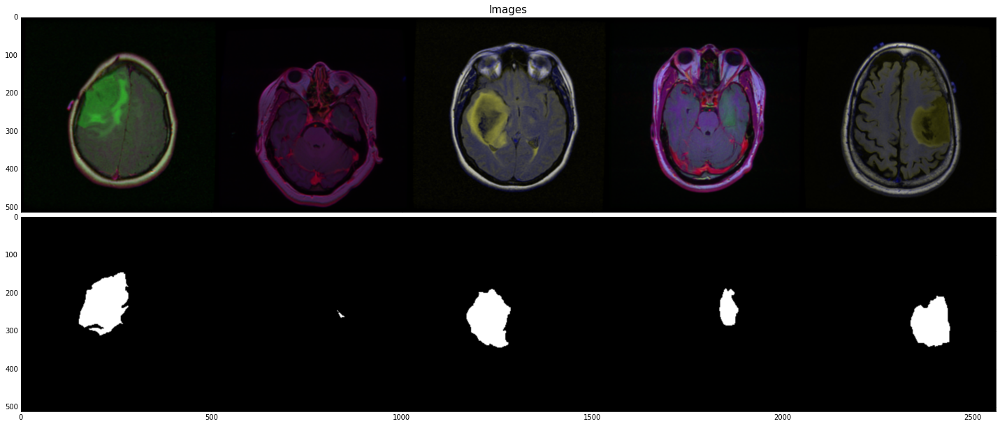

In [12]:
# Data
sample_df = df[df['diagnosis'] == 1].sample(5).values
sample_imgs = []
for i, data in enumerate(sample_df):
    img = cv2.resize(cv2.imread(data[1]), (IMG_SIZE, IMG_SIZE))
    mask = cv2.resize(cv2.imread(data[2]), (IMG_SIZE, IMG_SIZE))
    sample_imgs.extend([img, mask])

sample_imgs_arr = np.hstack(np.array(sample_imgs[::2]))
sample_masks_arr = np.hstack(np.array(sample_imgs[1::2]))

# Plot
fig = plt.figure(figsize=(25., 25.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 1),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

grid[0].imshow(sample_imgs_arr)
grid[0].set_title('Images', fontsize=15)
grid[0].axis('off')
grid[1].imshow(sample_masks_arr)
grid[1].set_title('Masks', fontsize=15, y=0.9)
grid[1].axis('off')
plt.show();

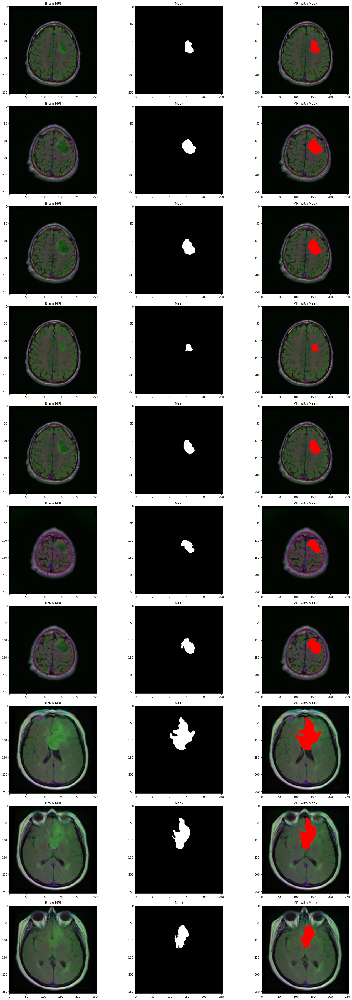

In [20]:
count = 0
fig, axs = plt.subplots(10, 3, figsize = (20, 50))
for i in range(len(df)):
    if df['diagnosis'][i] == 1 and count <10:
        img = io.imread(df.image_path[i])
        axs[count][0].title.set_text('Brain MRI')
        axs[count][0].imshow(img)

        mask = io.imread(df.mask_path[i])
        axs[count][1].title.set_text('Mask')
        axs[count][1].imshow(mask, cmap = 'gray')

        img[mask == 255] = (255, 0, 0)
        axs[count][2].title.set_text('MRI with Mask')
        axs[count][2].imshow(img)
        count+=1

fig.tight_layout()

## **Preprocessing**

split data on train set, validation set and test set.

In [14]:
df_train, df_test = train_test_split(df, test_size = 0.1, random_state = 42)
df_train, df_val = train_test_split(df_train, test_size = 0.1, random_state = 42)
print('train data shape: ', df_train.values.shape)
print('val data shape:   ', df_val.values.shape)
print('test data shape:  ', df_test.values.shape)

train data shape:  (3182, 4)
val data shape:    (354, 4)
test data shape:   (393, 4)


In [15]:
df_train['diagnosis'].value_counts()

0    2062
1    1120
Name: diagnosis, dtype: int64

In [16]:
df_val['diagnosis'].value_counts()

0    222
1    132
Name: diagnosis, dtype: int64

In [17]:
df_test['diagnosis'].value_counts()

0    272
1    121
Name: diagnosis, dtype: int64

In [18]:
def train_generator(data_frame, batch_size, aug_dict,
        image_color_mode='rgb',
        mask_color_mode='grayscale',
        image_save_prefix='image',
        mask_save_prefix='mask',
        save_to_dir=None,
        target_size=(256,256),
        seed=1):
    '''
    can generate image and mask at the same time use the same seed for
    image_datagen and mask_datagen to ensure the transformation for image
    and mask is the same if you want to visualize the results of generator,
    set save_to_dir = "your path"
    '''
    image_datagen = ImageDataGenerator(**aug_dict)
    mask_datagen = ImageDataGenerator(**aug_dict)
    
    image_generator = image_datagen.flow_from_dataframe(
        data_frame,
        x_col = 'image_path',
        class_mode = None,
        color_mode = image_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = image_save_prefix,
        seed = seed)

    mask_generator = mask_datagen.flow_from_dataframe(
        data_frame,
        x_col = 'mask_path',
        class_mode = None,
        color_mode = mask_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = mask_save_prefix,
        seed = seed)

    train_gen = zip(image_generator, mask_generator)
    
    for (img, mask) in train_gen:
        img, mask = adjust_data(img, mask)
        yield (img,mask)

def adjust_data(img,mask):
    img = img / 255
    mask = mask / 255
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    
    return (img, mask)

In [19]:
BATCH_SIZE = 32

train_generator_args = dict(rotation_range=0.2,
                            width_shift_range=0.05,
                            height_shift_range=0.05,
                            shear_range=0.05,
                            zoom_range=0.05,
                            horizontal_flip=True,
                            fill_mode='nearest')

train_gen = train_generator(df_train.iloc[:,1:3], BATCH_SIZE,
                                train_generator_args,
                                target_size=(256, 256))
    
val_gen = train_generator(df_val.iloc[:,1:3], BATCH_SIZE,
                                dict(),
                                target_size=(256, 256))

test_gen = train_generator(df_test.iloc[:,1:3], BATCH_SIZE,
                                dict(),
                                target_size=(256, 256))

## **Model 1: U-Net**

**Define Segmentation Loss**

Dice Similarity Coefficient:

$2 \times \frac{|X ∩ Y|}{(|X| + |Y|)}$

<p align="center">
  <img width="450" height="300" src="https://miro.medium.com/max/1198/1*xdyHz_peeiDzP2LUPGGFHw.png">
</p>

Intersection over union (IOU):

$IOU = \frac{area\ of\ overlap}{area\ of\ union}$

<p align="center">
  <img width="600" height="300" src="https://miro.medium.com/max/1400/1*kK0G-BmCqigHrc1rXs7tYQ.jpeg">
</p>

In [21]:
smooth=100

def dice_coef(y_true, y_pred):
    y_truef = K.flatten(y_true)
    y_predf = K.flatten(y_pred)
    And = K.sum(y_truef * y_predf)
    return((2* And + smooth) / (K.sum(y_truef) + K.sum(y_predf) + smooth))

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

def iou(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac

def jac_distance(y_true, y_pred):
    y_truef = K.flatten(y_true)
    y_predf = K.flatten(y_pred)
    return - iou(y_true, y_pred)

**Define U-Net**

Key aspects of UNet:

Convolution Layers: Convolution operation are used to learn information from images which then can be used as features for machine learning problems.

Down Sampling: Sequence of convolution combined with max pooling results in down sampling. In down sampling, size of the image is reduced which means we can observe larger portion of image in a single convolution operation. Down sampling is a good approach for identifying what is present in the image but for identifying where the object is we need to use upsampling.

Up Sampling: It is just opposite of down sampling. We go from low resolution to high resolution. For up sampling UNet uses transposed covolution which is achieved by taking transpose of filter kernels and reversing the process of convolution.

Following picture gives a clear picture of What a UNet is.

<p align="center">
  <img width="900" height="500" src="https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png">
</p>

In [22]:
def unet(input_size=(256,256,3)):
    inputs = Input(input_size)
    
    conv1 = Conv2D(64, (3, 3), padding='same')(inputs)
    bn1 = Activation('relu')(conv1)
    conv1 = Conv2D(64, (3, 3), padding='same')(bn1)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn1 = Activation('relu')(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(bn1)

    conv2 = Conv2D(128, (3, 3), padding='same')(pool1)
    bn2 = Activation('relu')(conv2)
    conv2 = Conv2D(128, (3, 3), padding='same')(bn2)
    bn2 = BatchNormalization(axis=3)(conv2)
    bn2 = Activation('relu')(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(bn2)

    conv3 = Conv2D(256, (3, 3), padding='same')(pool2)
    bn3 = Activation('relu')(conv3)
    conv3 = Conv2D(256, (3, 3), padding='same')(bn3)
    bn3 = BatchNormalization(axis=3)(conv3)
    bn3 = Activation('relu')(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(bn3)

    conv4 = Conv2D(512, (3, 3), padding='same')(pool3)
    bn4 = Activation('relu')(conv4)
    conv4 = Conv2D(512, (3, 3), padding='same')(bn4)
    bn4 = BatchNormalization(axis=3)(conv4)
    bn4 = Activation('relu')(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(bn4)

    conv5 = Conv2D(1024, (3, 3), padding='same')(pool4)
    bn5 = Activation('relu')(conv5)
    conv5 = Conv2D(1024, (3, 3), padding='same')(bn5)
    bn5 = BatchNormalization(axis=3)(conv5)
    bn5 = Activation('relu')(bn5)

    up6 = concatenate([Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bn5), conv4], axis=3)
    conv6 = Conv2D(512, (3, 3), padding='same')(up6)
    bn6 = Activation('relu')(conv6)
    conv6 = Conv2D(512, (3, 3), padding='same')(bn6)
    bn6 = BatchNormalization(axis=3)(conv6)
    bn6 = Activation('relu')(bn6)

    up7 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bn6), conv3], axis=3)
    conv7 = Conv2D(256, (3, 3), padding='same')(up7)
    bn7 = Activation('relu')(conv7)
    conv7 = Conv2D(256, (3, 3), padding='same')(bn7)
    bn7 = BatchNormalization(axis=3)(conv7)
    bn7 = Activation('relu')(bn7)

    up8 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(bn7), conv2], axis=3)
    conv8 = Conv2D(128, (3, 3), padding='same')(up8)
    bn8 = Activation('relu')(conv8)
    conv8 = Conv2D(128, (3, 3), padding='same')(bn8)
    bn8 = BatchNormalization(axis=3)(conv8)
    bn8 = Activation('relu')(bn8)

    up9 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(bn8), conv1], axis=3)
    conv9 = Conv2D(64, (3, 3), padding='same')(up9)
    bn9 = Activation('relu')(conv9)
    conv9 = Conv2D(64, (3, 3), padding='same')(bn9)
    bn9 = BatchNormalization(axis=3)(conv9)
    bn9 = Activation('relu')(bn9)

    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(bn9)

    return Model(inputs=[inputs], outputs=[conv10])

In [23]:
model = unet()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 activation (Activation)        (None, 256, 256, 64  0           ['conv2d[0][0]']                 
                                )                                                             

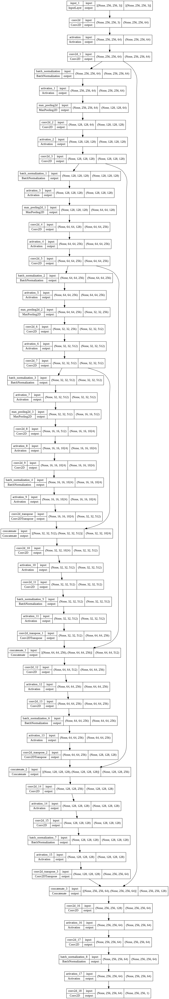

In [24]:
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

**Train the Model**

In [25]:
EPOCHS = 50
learning_rate = 1e-4

decay_rate = learning_rate / EPOCHS
opt = tf.optimizers.Adam(lr=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=None, decay=decay_rate, amsgrad=False)
model.compile(optimizer=opt, loss=dice_coef_loss, metrics=['binary_accuracy', iou, dice_coef])

callbacks = [ModelCheckpoint('unet_brain_mri_seg.hdf5', verbose=1, save_best_only=True)]

history = model.fit(train_gen,
                    steps_per_epoch=len(df_train) / BATCH_SIZE, 
                    epochs=EPOCHS, 
                    callbacks=callbacks,
                    validation_data = val_gen,
                    validation_steps=len(df_val) / BATCH_SIZE)

Found 3182 validated image filenames.
Found 3182 validated image filenames.
Epoch 1/50
100/99 [==============================] - ETA: 0s - loss: -0.1037 - binary_accuracy: 0.9190 - iou: 0.0560 - dice_coef: 0.1044Found 354 validated image filenames.
Found 354 validated image filenames.

Epoch 1: val_loss improved from inf to -0.02196, saving model to unet_brain_mri_seg.hdf5
99/99 [==============================] - 212s 2s/step - loss: -0.1037 - binary_accuracy: 0.9190 - iou: 0.0560 - dice_coef: 0.1044 - val_loss: -0.0220 - val_binary_accuracy: 0.9896 - val_iou: 0.0105 - val_dice_coef: 0.0204
Epoch 2/50
100/99 [==============================] - ETA: 0s - loss: -0.1614 - binary_accuracy: 0.9810 - iou: 0.0890 - dice_coef: 0.1614
Epoch 2: val_loss did not improve from -0.02196
99/99 [==============================] - 159s 2s/step - loss: -0.1614 - binary_accuracy: 0.9810 - iou: 0.0890 - dice_coef: 0.1614 - val_loss: -0.0199 - val_binary_accuracy: 0.9897 - val_iou: 0.0099 - val_dice_coef: 0.

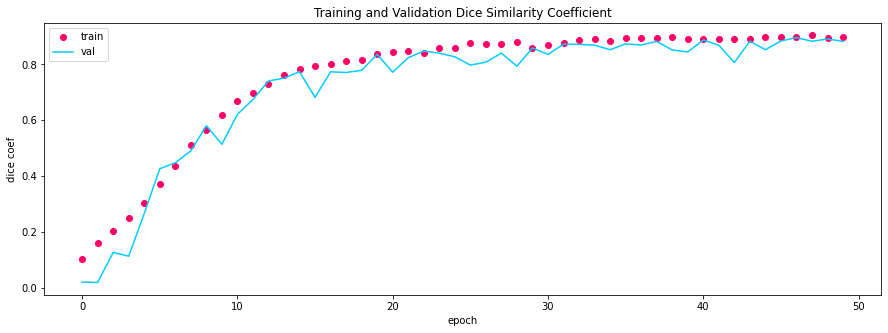

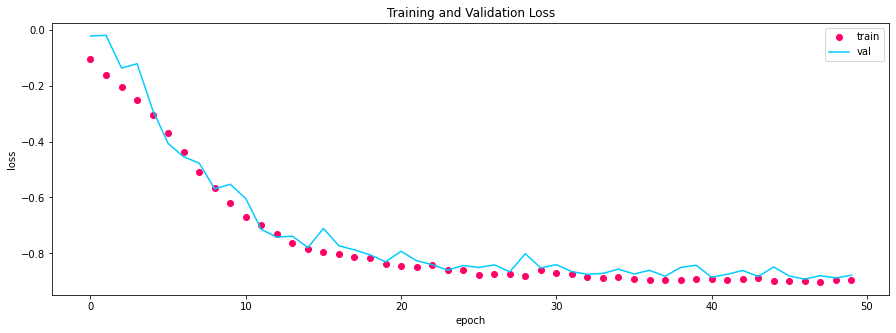

In [43]:
#-----------------------------------------------------------
# Retrieve a list of list results on training and validation data
# sets for each training epoch
#-----------------------------------------------------------
acc      = history.history['dice_coef']
val_acc  = history.history['val_dice_coef']
loss     = history.history['loss']
val_loss = history.history['val_loss']

epochs   = range(len(acc)) # Get number of epochs

#------------------------------------------------
# Plot training and validation accuracy per epoch
#------------------------------------------------
plt.figure(figsize=(15,5))
plt.plot  (epochs, acc, 'bo', color = '#ff0066')
plt.plot  (epochs, val_acc, color = '#00ccff')
plt.title ('Training and Validation Dice Similarity Coefficient')
plt.legend(['train', 'val'], loc='upper left')
plt.ylabel('dice coef')
plt.xlabel('epoch');

#------------------------------------------------
# Plot training and validation loss per epoch
#------------------------------------------------
plt.figure(figsize=(15,5))
plt.plot  (epochs, loss, 'bo', color = '#ff0066')
plt.plot  (epochs, val_loss, color = '#00ccff')
plt.legend(['train', 'val'], loc='upper right')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.title ('Training and Validation Loss');

In [38]:
model = load_model('unet_brain_mri_seg.hdf5', custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})

In [40]:
results = model.evaluate(test_gen, steps=len(df_test) / BATCH_SIZE)
print('Test loss: ', results[0])
print('Test IOU: ', results[2])
print('Test Dice Coefficent: ', results[3])

12/12 [==============================] - 6s 466ms/step - loss: -0.8989 - binary_accuracy: 0.9981 - iou: 0.8252 - dice_coef: 0.9028
Test loss:  -0.8989318609237671
Test IOU:  0.825218915939331
Test Dice Coefficent:  0.9027502536773682


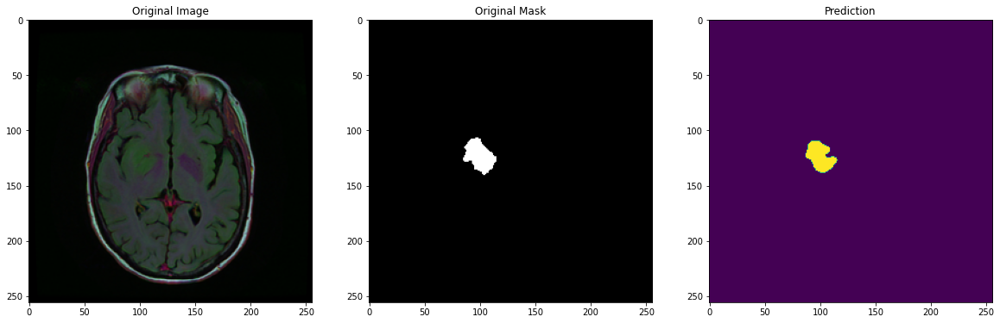

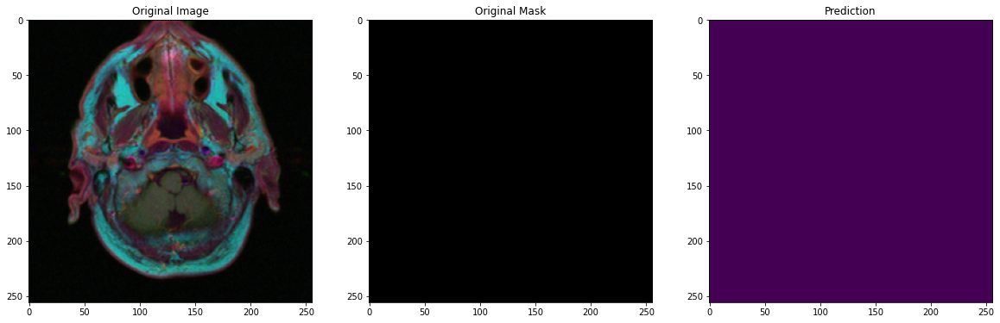

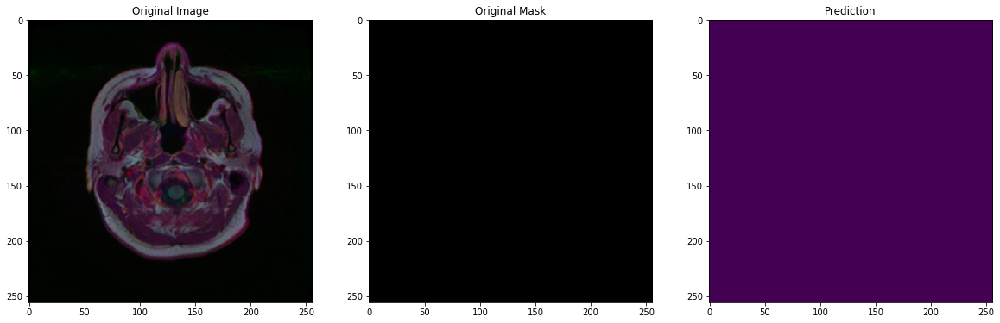

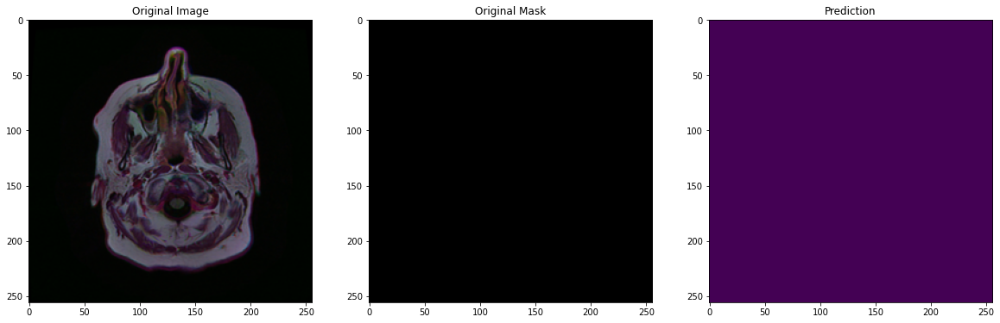

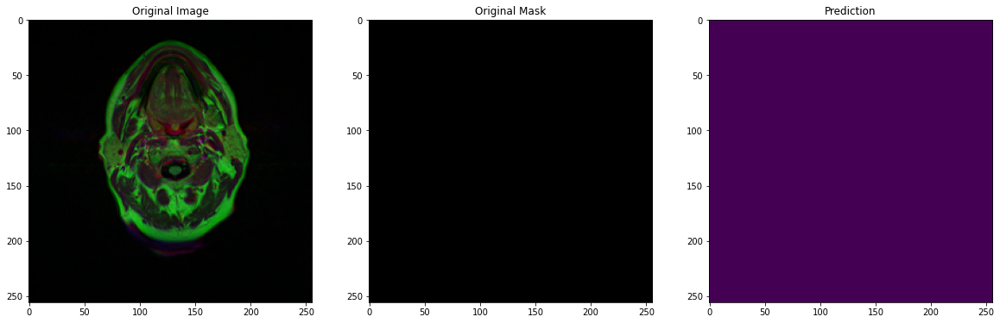

...

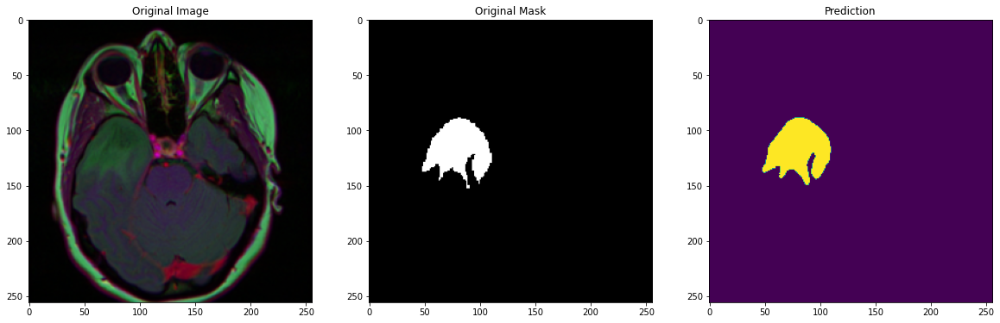

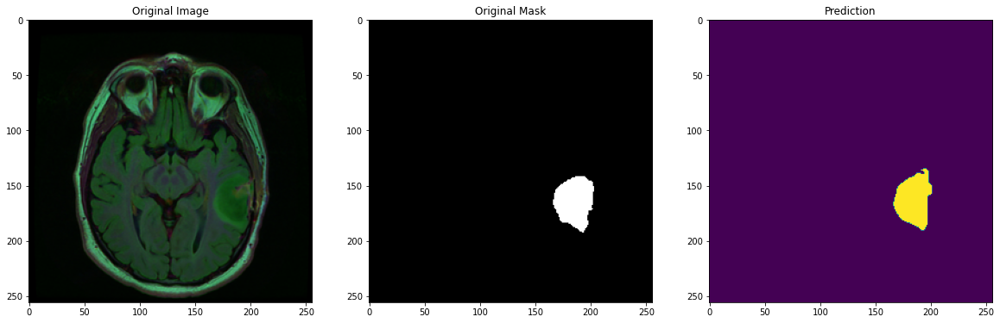

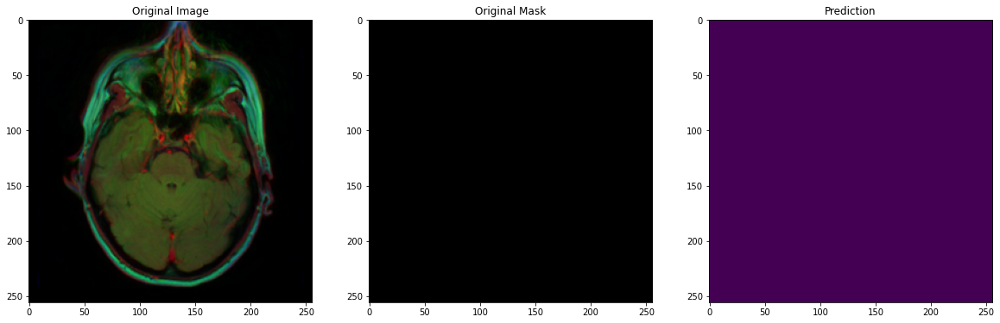

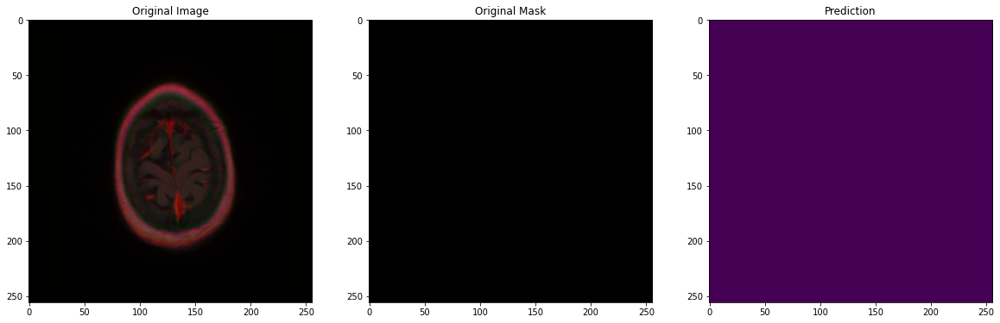

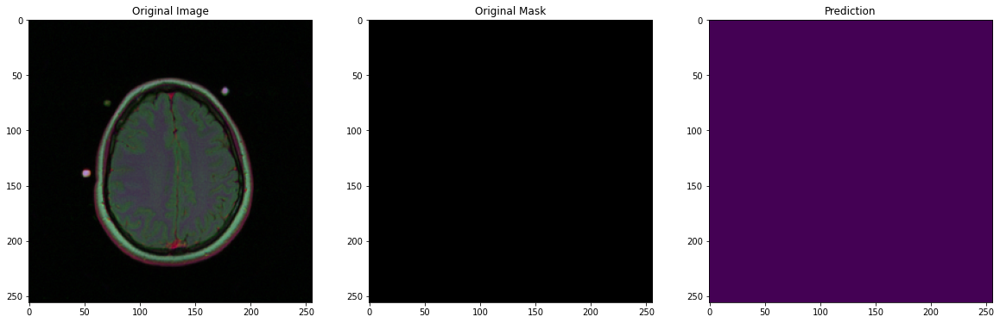

In [44]:
for i in range(30):
    index = np.random.randint(1,len(df_test.index))
    img = cv2.imread(df_test['image_path'].iloc[index])
    img = cv2.resize(img ,(256, 256))
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred = model.predict(img)

    plt.figure(figsize=(20,50))
    plt.subplot(1,3,1)
    plt.imshow(np.squeeze(img))
    plt.title('Original Image')
    plt.subplot(1,3,2)
    plt.imshow(np.squeeze(cv2.imread(df_test['mask_path'].iloc[index])))
    plt.title('Original Mask')
    plt.subplot(1,3,3)
    plt.imshow(np.squeeze(pred) > .5)
    plt.title('Prediction')
    plt.show()